<h1><center>CSCI 4146/6409 - Process of Data Science (Summer 2023)</h1></center>
<h1><center>Assignment 5</h1></center>

<b>Tasneem Hoque</b>  
<b><B00841761> </b>


<b>Karan Aggarwal</b>  
<b><B00912580> </b> 

### Q1: Preprocessing, Exploratory Data Analysis and Part-of-Speech Tagging (Applies only to IMDB movie review dataset) [1]

#### a. Load the datasets.

In [70]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud

directory = 'aclImdb/train'

def load_data(directory):
    sentiment_mapping = {'neg': 'negative', 'pos': 'positive'}

    reviews = []
    sentiments = []

    for sentiment_folder in ['neg', 'pos']:
        sentiment = sentiment_mapping.get(sentiment_folder, 'unsupervised')
        sentiment_directory = os.path.join(directory, sentiment_folder)
        for filename in os.listdir(sentiment_directory):
            file_path = os.path.join(sentiment_directory, filename)
            with open(file_path, 'r', encoding='utf-8') as file:
                review = file.read()
                reviews.append(review)
                sentiments.append(sentiment)

    return pd.DataFrame({'review': reviews, 'sentiment': sentiments})
    
train_data = load_data('aclImdb/train')
test_data = load_data('aclImdb/test')

In [71]:
train_data['sentiment'].unique()

array(['negative', 'positive'], dtype=object)

In [72]:
train_data.head()

,review,sentiment
0,Story of a man who has unnatural feelings for ...,negative
1,Airport '77 starts as a brand new luxury 747 p...,negative
2,This film lacked something I couldn't put my f...,negative
3,"Sorry everyone,,, I know this is supposed to b...",negative
4,When I was little my parents took me along to ...,negative


In [73]:
test_data['sentiment'].unique()

array(['negative', 'positive'], dtype=object)

In [74]:
test_data.head()

,review,sentiment
0,Once again Mr. Costner has dragged out a movie...,negative
1,This is an example of why the majority of acti...,negative
2,"First of all I hate those moronic rappers, who...",negative
3,Not even the Beatles could write songs everyon...,negative
4,Brass pictures (movies is not a fitting word f...,negative


#### b. Perform exploratory data analysis: check the distribution of sentiments/emotions, the number of unique words, average review length, etc. Include any interesting observations.

In [75]:
sentiment_counts = train_data['sentiment'].value_counts()
print(sentiment_counts)

negative    12500
positive    12500
Name: sentiment, dtype: int64


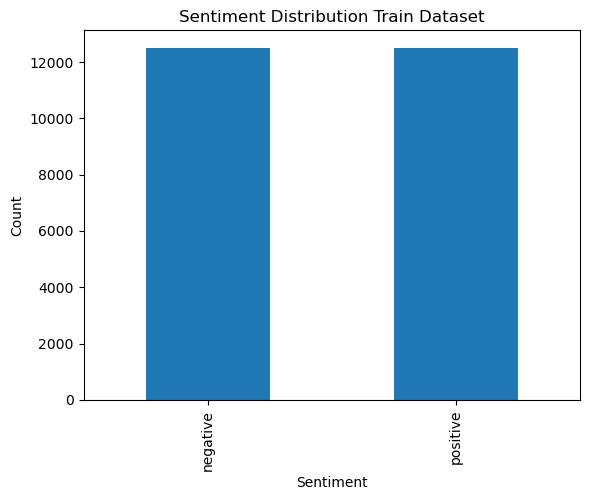

In [76]:

sentiment_counts.plot(kind='bar')
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.title('Sentiment Distribution Train Dataset')
plt.show()

In [77]:
sentiment_counts = test_data['sentiment'].value_counts()
print(sentiment_counts)

negative    12500
positive    12500
Name: sentiment, dtype: int64


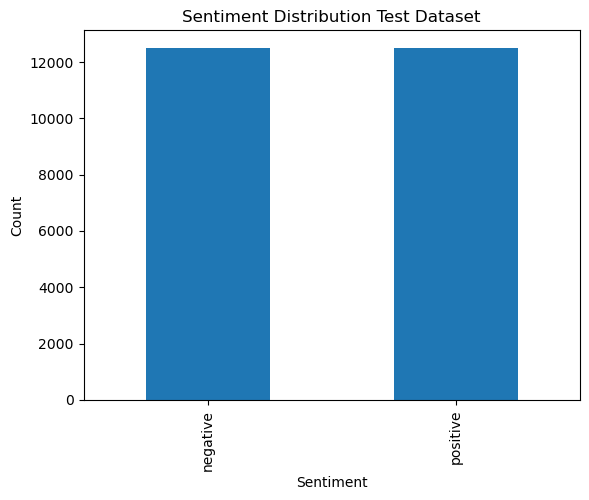

In [78]:
sentiment_counts.plot(kind='bar')
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.title('Sentiment Distribution Test Dataset')
plt.show()

In [79]:
def avg_length(imdb_df):
    imdb_df['review_length'] = imdb_df['review'].apply(lambda x: len(x.split()))
    average_review_length = imdb_df['review_length'].mean()
    return average_review_length

print("Average Review Length Train Dataset:", avg_length(train_data))
print("Average Review Length Test Dataset:", avg_length(test_data))

Average Review Length Train Dataset: 233.7872
Average Review Length Test Dataset: 228.52668


In [80]:
def avg_length_sentiment(imdb_df, sent):
    positive_reviews = imdb_df[imdb_df['sentiment'] == sent]
    return positive_reviews['review_length'].mean()

print("Average Review Length Train Set (Positive Sentiment):", avg_length_sentiment(train_data, 'positive'))
print("Average Review Length Train Set (Negative Sentiment):", avg_length_sentiment(train_data, 'negative'))
print("Average Review Length Test Set (Positive Sentiment):", avg_length_sentiment(test_data, 'positive'))
print("Average Review Length Test Set (Negative Sentiment):", avg_length_sentiment(test_data, 'negative'))

Average Review Length Train Set (Positive Sentiment): 236.70656
Average Review Length Train Set (Negative Sentiment): 230.86784
Average Review Length Test Set (Positive Sentiment): 228.99208
Average Review Length Test Set (Negative Sentiment): 228.06128


In [81]:
def word_cloud (imdb_df, sentiment):
    all_reviews = ' '.join(imdb_df[imdb_df['sentiment'] == sentiment]['review'])

    wordcloud = WordCloud(width=800, height=400, max_words=100, background_color='white').generate(all_reviews)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title('Word Cloud - IMDB Movie Reviews')
    plt.show()

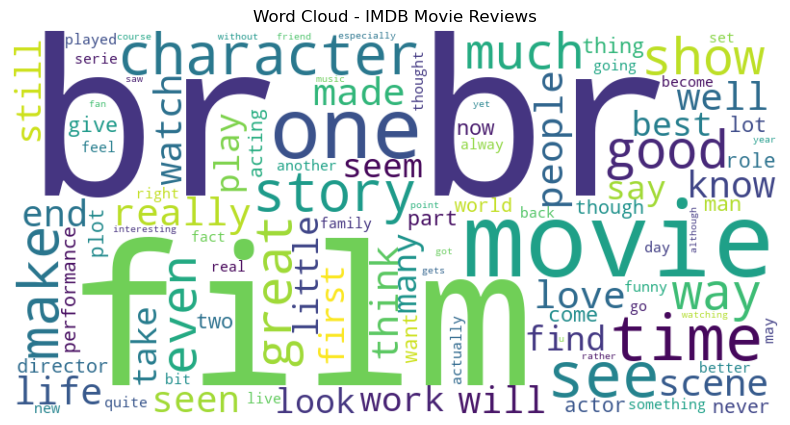

In [82]:
word_cloud(train_data, 'positive')

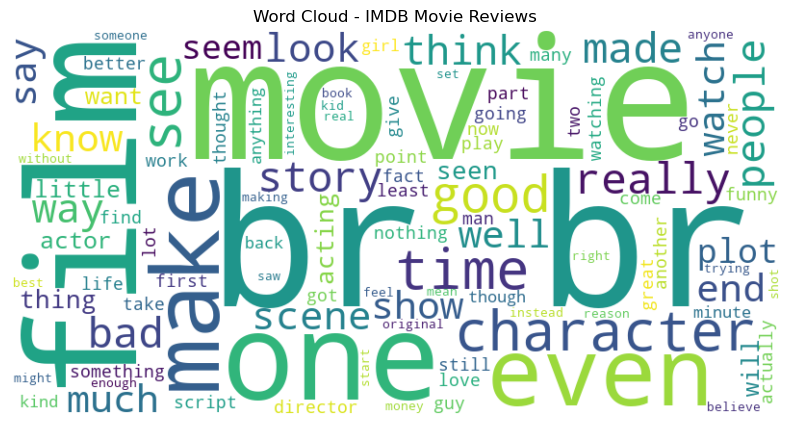

In [83]:
word_cloud(train_data, 'negative')

In [84]:
def rev_length(imdb_df):
    imdb_df['review_length'] = imdb_df['review'].apply(lambda x: len(x.split()))

    plt.figure(figsize=(10, 5))
    plt.hist(imdb_df['review_length'], bins=30, edgecolor='black')
    plt.xlabel('Review Length')
    plt.ylabel('Frequency')
    plt.title('Distribution of Review Lengths')
    plt.show()

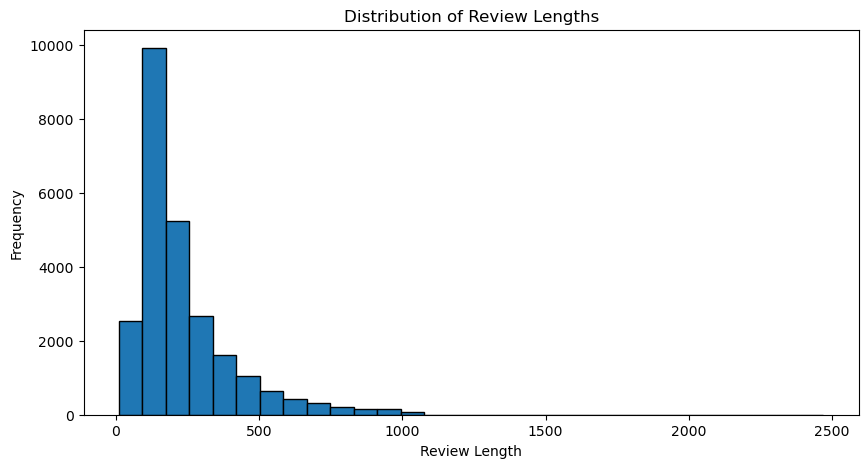

In [85]:
rev_length(train_data)

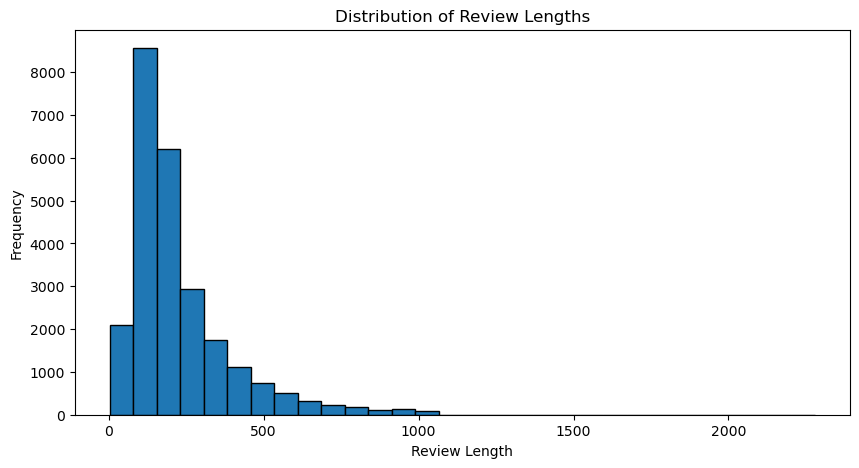

In [86]:
rev_length(test_data)

#### c. Preprocess the text data: tokenize the reviews/tweets, remove stop words, and apply stemming/lemmatization.

In [87]:
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer, WordNetLemmatizer
from nltk.tokenize import word_tokenize

nltk.download('omw-1.4')

nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

def preprocess(imdb_df):

    # Tokenize the reviews/tweets
    imdb_df['review'] = imdb_df['review'].astype(str)
    imdb_df['review'] = imdb_df['review'].apply(word_tokenize)

    # Remove stop words
    stop_words = set(stopwords.words('english'))
    imdb_df['review'] = imdb_df['review'].apply(lambda x: [word for word in x if word.casefold() not in stop_words])

    # Apply stemming
    stemmer = PorterStemmer()
    imdb_df['review'] = imdb_df['review'].apply(lambda x: [stemmer.stem(word) for word in x])

    # Apply lemmatization
    lemmatizer = WordNetLemmatizer()
    imdb_df['review'] = imdb_df['review'].apply(lambda x: [lemmatizer.lemmatize(word) for word in x])
    
    return imdb_df

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\Tasne\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Tasne\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Tasne\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Tasne\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [88]:
train_data = preprocess(train_data)
test_data = preprocess(test_data)

#### d. Perform part-of-speech (POS) tagging on the preprocessed text. Briefly discuss the importance and potential uses of POS tagging in NLP.

In [89]:
nltk.download('averaged_perceptron_tagger')

train_data['pos_tags'] = train_data['review'].apply(nltk.pos_tag)
test_data['pos_tags'] = test_data['review'].apply(nltk.pos_tag)

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Tasne\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [90]:
train_data.head()

,review,sentiment,review_length,pos_tags
0,"[stori, man, unnatur, feel, pig, ., start, ope...",negative,112,"[(stori, JJ), (man, NN), (unnatur, JJ), (feel,..."
1,"[airport, '77, start, brand, new, luxuri, 747,...",negative,801,"[(airport, NN), ('77, POS), (start, NN), (bran..."
2,"[film, lack, someth, could, n't, put, finger, ...",negative,141,"[(film, NN), (lack, NN), (someth, NN), (could,..."
3,"[sorri, everyon, ,, ,, ,, know, suppos, ``, ar...",negative,154,"[(sorri, NN), (everyon, NN), (,, ,), (,, ,), (..."
4,"[littl, parent, took, along, theater, see, int...",negative,395,"[(littl, JJ), (parent, NN), (took, VBD), (alon..."


In [91]:
test_data.head()

,review,sentiment,review_length,pos_tags
0,"[mr., costner, drag, movi, far, longer, necess...",negative,168,"[(mr., NN), (costner, NN), (drag, VBP), (movi,..."
1,"[exampl, major, action, film, ., gener, bore, ...",negative,234,"[(exampl, RB), (major, JJ), (action, NN), (fil..."
2,"[first, hate, moron, rapper, ,, could'nt, act,...",negative,225,"[(first, RB), (hate, VB), (moron, NN), (rapper..."
3,"[even, beatl, could, write, song, everyon, lik...",negative,308,"[(even, RB), (beatl, NN), (could, MD), (write,..."
4,"[brass, pictur, (, movi, fit, word, ), realli,...",negative,242,"[(brass, NN), (pictur, NN), ((, (), (movi, JJ)..."


Syntax and Grammar Analysis: POS tagging provides information about the syntactic category of each word, allowing for the analysis of sentence structure, noun phrases, verb phrases, and more. It helps in understanding the grammatical relationships between words in a sentence.

Information Extraction: POS tagging helps in extracting specific types of information from text. For example, by identifying nouns, adjectives, and verbs, we can extract key entities, attributes, or actions mentioned in a document.

Sentiment Analysis: POS tagging can be used as a feature for sentiment analysis tasks. The identification of adjectives and adverbs, which often express sentiment, can contribute to determining the sentiment polarity of a sentence or document.

Grammar Checking and Text Correction: POS tagging can be used to identify grammatical errors or inconsistencies in text. It helps in performing grammar checking and suggesting corrections.

### Q2: Sentiment Analysis with Bag of Words (BoW) and TF-IDF [1]

#### a. Convert the preprocessed IMDB movie reviews into a matrix of token counts with the CountVectorizer from sklearn.

In [92]:
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd

cv=CountVectorizer()

cv_train_reviews = cv.fit_transform(train_data['review'].apply(" ".join))
cv_test_reviews = cv.transform(test_data['review'].apply(" ".join))

print('BOW_cv_train:',cv_train_reviews.shape)
print('BOW_cv_test:',cv_test_reviews.shape)

BOW_cv_train: (25000, 57682)
BOW_cv_test: (25000, 57682)


#### b. Also, represent the reviews using TF-IDF and briefly explain the concept and its importance in text mining

In [93]:
from sklearn.feature_extraction.text import TfidfVectorizer
tv=TfidfVectorizer(min_df=0,max_df=1,use_idf=True,ngram_range=(1,3))

tv_train_reviews=tv.fit_transform(train_data['review'].apply(" ".join))

tv_test_reviews=tv.transform(test_data['review'].apply(" ".join))

print('Tfidf_train:',tv_train_reviews.shape)
print('Tfidf_test:',tv_test_reviews.shape)

Tfidf_train: (25000, 3927514)
Tfidf_test: (25000, 3927514)


#### c. Divide your data into a training set and a test set (If required).

In [94]:
from sklearn.preprocessing import LabelBinarizer

lb=LabelBinarizer()

sentiment_data_test=lb.fit_transform(test_data['sentiment'])
sentiment_data_train=lb.fit_transform(train_data['sentiment'])

#### d. Train a logistic regression classifier on your BoW and TF-IDF representations. Report the accuracy, precision, recall, and F1-score on your test set. Compare the performances of BoW and TF-IDF.

In [95]:
from sklearn.linear_model import LogisticRegression

In [96]:
lr_bow = LogisticRegression()
lr_bow.fit(cv_train_reviews, sentiment_data_train)
print(lr_bow)

C:\Users\Tasne\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LogisticRegression()


C:\Users\Tasne\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [97]:
lr_tfidf = LogisticRegression()
lr_tfidf.fit(tv_train_reviews, sentiment_data_test)
print(lr_tfidf)

C:\Users\Tasne\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LogisticRegression()


In [98]:
lr_bow_predict=lr_bow.predict(cv_test_reviews)
print(lr_bow_predict)

[0 1 0 ... 1 1 0]


In [99]:
lr_tfidf_predict=lr_tfidf.predict(tv_test_reviews)
print(lr_tfidf_predict)

[0 0 0 ... 1 1 1]


In [100]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

lr_bow_score=accuracy_score(sentiment_data_test,lr_bow_predict)
print("lr_bow_score :", lr_bow_score)

lr_bow_score : 0.85272


In [101]:
lr_tfidf_score=accuracy_score(sentiment_data_test, lr_tfidf_predict)
print("lr_tfidf_score :", lr_tfidf_score)

lr_tfidf_score : 0.685


In [102]:
accuracy_bow = accuracy_score(sentiment_data_test, lr_bow_predict)
precision_bow = precision_score(sentiment_data_test, lr_bow_predict, pos_label=0)
recall_bow = recall_score(sentiment_data_test, lr_bow_predict, pos_label=0)
f1_score_bow = f1_score(sentiment_data_test, lr_bow_predict, pos_label=0)

print("BoW Representation:")
print("Accuracy:", accuracy_bow)
print("Precision:", precision_bow)
print("Recall:", recall_bow)
print("F1-Score:", f1_score_bow)

BoW Representation:
Accuracy: 0.85272
Precision: 0.8456412668548134
Recall: 0.86296
F1-Score: 0.8542128603104213


In [103]:
accuracy_tfidf = accuracy_score(sentiment_data_test, lr_tfidf_predict)
precision_tfidf = precision_score(sentiment_data_test, lr_tfidf_predict, pos_label=0)
recall_tfidf = recall_score(sentiment_data_test, lr_tfidf_predict, pos_label=0)
f1_score_tfidf = f1_score(sentiment_data_test, lr_tfidf_predict, pos_label=0)

print("TF-IDF Representation:")
print("Accuracy:", accuracy_tfidf)
print("Precision:", precision_tfidf)
print("Recall:", recall_tfidf)
print("F1-Score:", f1_score_tfidf)

TF-IDF Representation:
Accuracy: 0.685
Precision: 0.6722789242345228
Recall: 0.72192
F1-Score: 0.6962157157736373


### Q3: Sentiment Analysis with Word Embeddings [1]

#### a. Using the Word2Vec model, convert the preprocessed movie reviews into vectors.

In [104]:
from gensim.models import Word2Vec

word2vec_model = Word2Vec(train_data['review'], window=5, min_count=1, workers=4)

In [105]:
word2vec_model.wv.index_to_key

[',',
 '.',
 '/',
 '>',
 '<',
 'br',
 "'s",
 'movi',
 'film',
 ')',
 '(',
 "n't",
 "''",
 '``',
 'one',
 '!',
 'like',
 '?',
 'time',
 'good',
 'make',
 'get',
 'see',
 'charact',
 'watch',
 'would',
 'even',
 'stori',
 'realli',
 'scene',
 "'",
 ':',
 'well',
 '-',
 '...',
 'look',
 'show',
 'much',
 'could',
 'end',
 'peopl',
 'also',
 'go',
 'great',
 'bad',
 'first',
 'think',
 'love',
 'play',
 'way',
 'act',
 'thing',
 'made',
 'say',
 'know',
 'seem',
 '*',
 'work',
 ';',
 'mani',
 'two',
 'plot',
 'come',
 'actor',
 'want',
 'seen',
 'take',
 'never',
 'littl',
 'year',
 'tri',
 'best',
 'life',
 'ever',
 'give',
 'man',
 'still',
 'better',
 'find',
 'perform',
 'feel',
 'part',
 "'ve",
 '--',
 'use',
 'actual',
 'someth',
 'back',
 'interest',
 "'m",
 'lot',
 'director',
 'woman',
 'real',
 'though',
 'cast',
 'anoth',
 'enjoy',
 'live',
 'new',
 'noth',
 'guy',
 'role',
 'music',
 'funni',
 'start',
 'point',
 'old',
 'star',
 'origin',
 'everi',
 'girl',
 'set',
 'u',
 'bel

In [112]:
def AvgWordToVec(doc):
    return np.mean([word2vec_model.wv[word] for word in doc if word in word2vec_model.wv.index_to_key], axis = 0)

In [113]:
from tqdm import tqdm

train_data_vectorised = []
for doc in tqdm(train_data['review']):
    train_data_vectorised.append(AvgWordToVec(doc))
    
test_data_vectorised = []
for doc in tqdm(test_data['review']):
    test_data_vectorised.append(AvgWordToVec(doc))

100%|██████████| 25000/25000 [09:23<00:00, 44.37it/s] 


#### b. Train the same type of classifier (logistic regression) on these new features. Again, report the accuracy, precision, recall, and F1-score on your test set.

In [114]:
lr = LogisticRegression()
lr.fit(train_data_vectorised, sentiment_data_train)

C:\Users\Tasne\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\Tasne\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [119]:
y_pred = lr.predict(test_data_vectorised)

accuracy = accuracy_score(sentiment_data_test, y_pred)
precision = precision_score(sentiment_data_test, y_pred, pos_label=0)
recall = recall_score(sentiment_data_test, y_pred, pos_label=0)
f1_score = f1_score(sentiment_data_test, y_pred, pos_label=0)

print("Performance Metrics:")
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-Score:", f1_score)

Performance Metrics:
Accuracy: 0.81068
Precision: 0.8142244518164901
Recall: 0.80504
F1-Score: 0.8096061788487067


#### c. Compare the performance of the BoW, TF-IDF, and Word2Vec models. Discuss any improvements or regressions observed.

The BoW model is an obvious winner when compared to the TF-IDF model with atleast 15% more accuracy. When it comes to the Word2Vector model, BoW is still slightly better with 5% more accuracy. So of the three models we have tested, BoW model is the best.

### Q4: Emotion Classification [1]

In [41]:
directory = 'PartB'
import re

#### a. On the SemEval-2018 Task 1 dataset, build two classification models to classify tweets into various emotion categories: one using the BoW method and one using Word2Vec.

Firstly we will load the data.

In [42]:
def load_data(directory):
    return pd.read_csv(directory, delimiter='\t')
    
train_data = load_data('PartB/2018-E-c-En-train.txt')
test_data = load_data('PartB/2018-E-c-En-test.txt')
dev_data = load_data('PartB/2018-E-c-En-dev.txt')

In [43]:
train_data.head()

,ID,Tweet,anger,anticipation,disgust,fear,joy,love,optimism,pessimism,sadness,surprise,trust
0,2017-En-21441,“Worry is a down payment on a problem you may ...,0,1,0,0,0,0,1,0,0,0,1
1,2017-En-31535,Whatever you decide to do make sure it makes y...,0,0,0,0,1,1,1,0,0,0,0
2,2017-En-21068,@Max_Kellerman it also helps that the majorit...,1,0,1,0,1,0,1,0,0,0,0
3,2017-En-31436,Accept the challenges so that you can literall...,0,0,0,0,1,0,1,0,0,0,0
4,2017-En-22195,My roommate: it's okay that we can't spell bec...,1,0,1,0,0,0,0,0,0,0,0


To remove the noise from the tweet text we have to  download certain packages from NLTK. 

In [44]:
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer, WordNetLemmatizer
from nltk.tokenize import word_tokenize
import ssl

try:
    _create_unverified_https_context = ssl._create_unverified_context
except AttributeError:
    pass
else:
    ssl._create_default_https_context = _create_unverified_https_context
nltk.download('omw')

nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package omw to
[nltk_data]     C:\Users\Tasne\AppData\Roaming\nltk_data...
[nltk_data]   Package omw is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Tasne\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Tasne\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Tasne\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

Next, we will remove all words starting with '@' and '&'. 

We will change all the words to lowercase. 

We will remove single-character words as they are not necessary. 

We will remove any leading or trailing whitespaces. 

We will replace any non-alphanumeric words. 

Additionally, we will remove the stopwords.

Perform lemmatization to ensure correct English and formalize the text.

In [45]:
def preprocess(data):
    data['Tweet'] = data['Tweet'].str.lower()
    data['Tweet'] = data['Tweet'].str.replace(r'@\w+', '', regex=True)
    data['Tweet'] = data['Tweet'].str.replace(r'&\w+', '', regex=True)
    data['Tweet'] = data['Tweet'].apply(lambda x: re.sub(r'\W+', ' ', x))
    data['Tweet'] = data['Tweet'].str.strip()
    data['Tweet'] = data['Tweet'].apply(lambda x: re.sub(r'\W', ' ', x))
    data['Tweet'] = data['Tweet'].apply(lambda x: re.sub(r'\s+', ' ', x))

    stop_words = set(stopwords.words('english'))
    data['Tweet'] = data['Tweet'].apply(lambda x: ' '.join([word for word in word_tokenize(x) if word not in stop_words and not word.startswith('&')]))

    lemmatizer = WordNetLemmatizer()
    data['Tweet'] = data['Tweet'].apply(lambda x: ' '.join([lemmatizer.lemmatize(word) for word in word_tokenize(x) if len(word)>1]))
    
    return data

In [46]:
train_data = preprocess(train_data)
test_data = preprocess(test_data)
dev_data = preprocess(dev_data)
train_data = train_data.drop(['ID'], axis=1)
test_data = test_data.drop(['ID'], axis=1)
dev_data = dev_data.drop(['ID'], axis=1)

In [47]:
train_data.head()

,Tweet,anger,anticipation,disgust,fear,joy,love,optimism,pessimism,sadness,surprise,trust
0,worry payment problem may never joyce meyer mo...,0,1,0,0,0,0,1,0,0,0,1
1,whatever decide make sure make happy,0,0,0,0,1,1,1,0,0,0,0
2,also help majority nfl coaching inept bill bri...,1,0,1,0,1,0,1,0,0,0,0
3,accept challenge literally even feel exhilarat...,0,0,0,0,1,0,1,0,0,0,0
4,roommate okay spell autocorrect terrible first...,1,0,1,0,0,0,0,0,0,0,0


In [48]:
test_data.head()

,Tweet,anger,anticipation,disgust,fear,joy,love,optimism,pessimism,sadness,surprise,trust
0,dont worry indian army way dispatch terrorist ...,NONE,NONE,NONE,NONE,NONE,NONE,NONE,NONE,NONE,NONE,NONE
1,academy science eschews normally sober tone sc...,NONE,NONE,NONE,NONE,NONE,NONE,NONE,NONE,NONE,NONE,NONE
2,blew opportunity __ mad,NONE,NONE,NONE,NONE,NONE,NONE,NONE,NONE,NONE,NONE,NONE
3,time week 30,NONE,NONE,NONE,NONE,NONE,NONE,NONE,NONE,NONE,NONE,NONE
4,deppression real partner depressed people trul...,NONE,NONE,NONE,NONE,NONE,NONE,NONE,NONE,NONE,NONE,NONE


In [49]:
dev_data.head()

,Tweet,anger,anticipation,disgust,fear,joy,love,optimism,pessimism,sadness,surprise,trust
0,oh hidden revenge anger rememberthe time rebutted,1,0,1,0,0,0,0,0,0,0,0
1,make sure smiling bro,0,0,0,0,1,1,1,0,0,0,0
2,teamchristine bc tana done provoke tweeting sh...,1,0,1,0,0,0,0,0,0,0,0
3,great start beginner jump auto trading profita...,0,0,0,0,1,0,1,0,0,0,0
4,best friend driving first time car terrifying,0,0,0,1,0,0,0,0,0,0,0


In [50]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from gensim.models import Word2Vec
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

We will remove the word 'people' as it is frequently used as an object and does not carry substantial meaning. As we can observe, 'people' is an exceedingly common term, and its usage does not contribute significantly to the context. Therefore, we will exclude this word from the text to enhance linguistic accuracy and formality.

In [51]:
train_data['Tweet'] = train_data['Tweet'].apply(lambda x: ' '.join([word for word in word_tokenize(x) if word.lower() != 'people']))
test_data['Tweet'] = train_data['Tweet'].apply(lambda x: ' '.join([word for word in word_tokenize(x) if word.lower() != 'people']))
dev_data['Tweet'] = train_data['Tweet'].apply(lambda x: ' '.join([word for word in word_tokenize(x) if word.lower() != 'people']))

Next we will show the most used words on the basis of emotions.

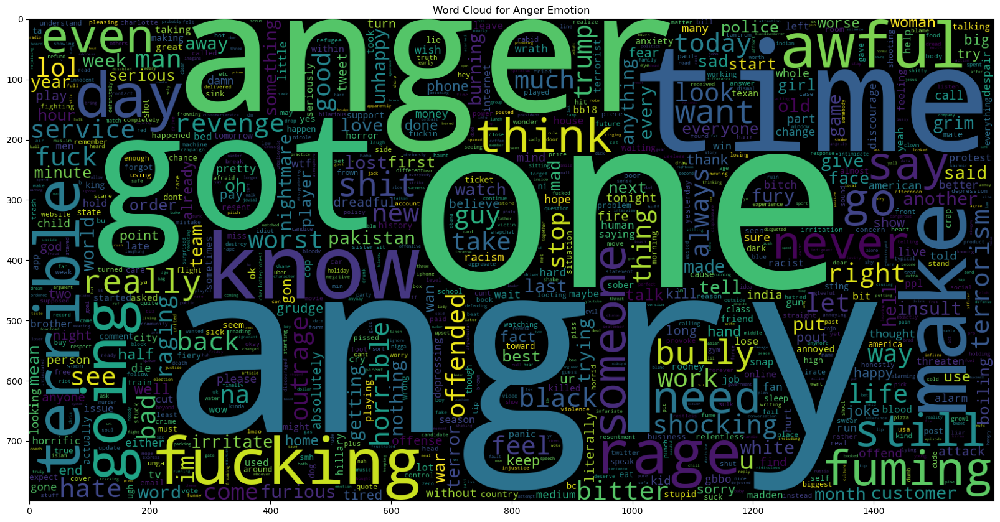

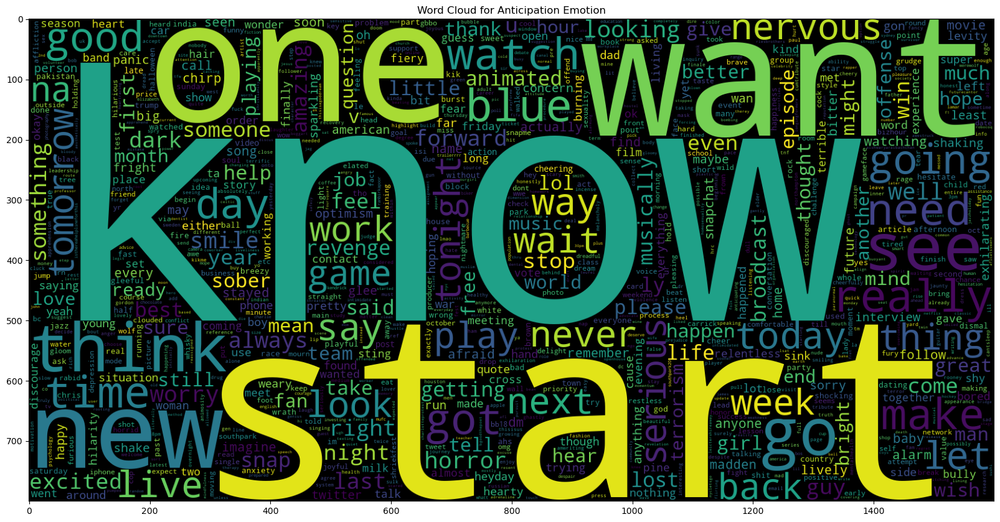

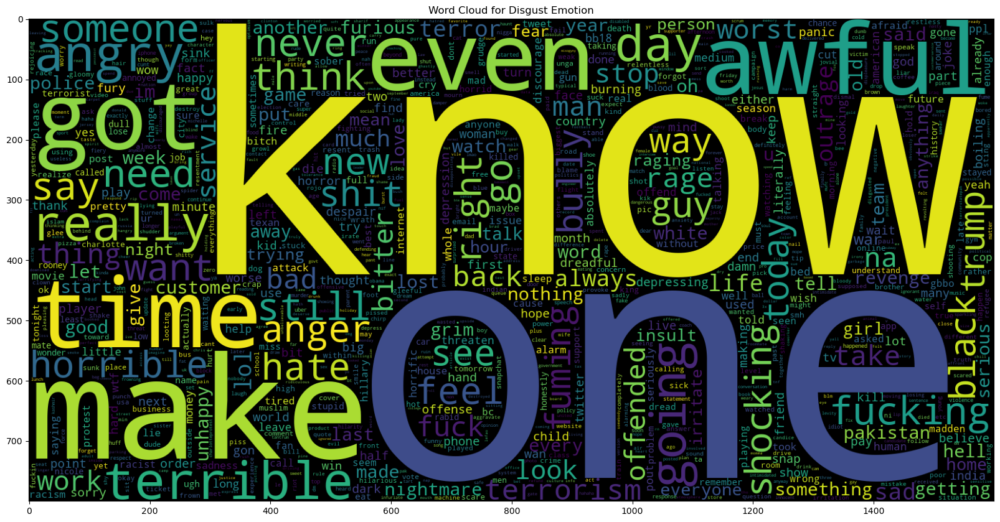

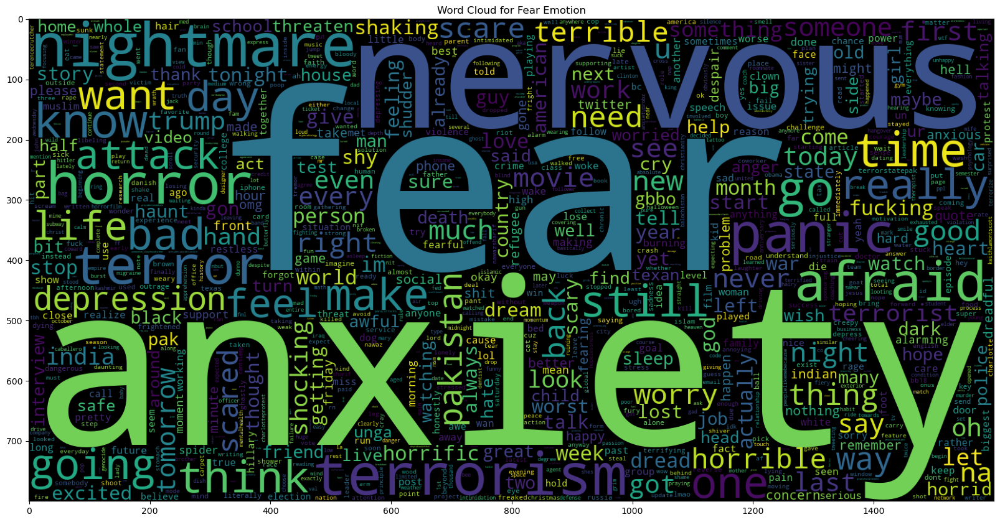

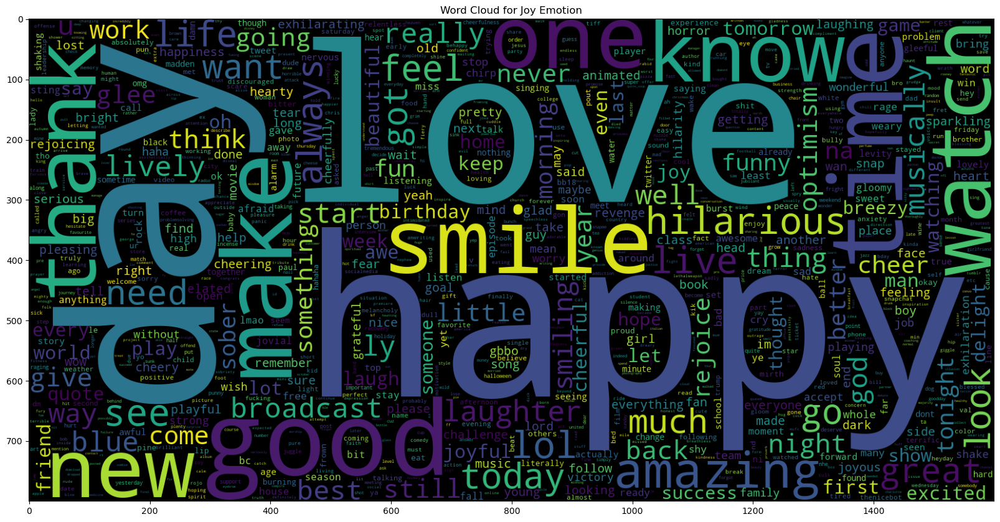

...

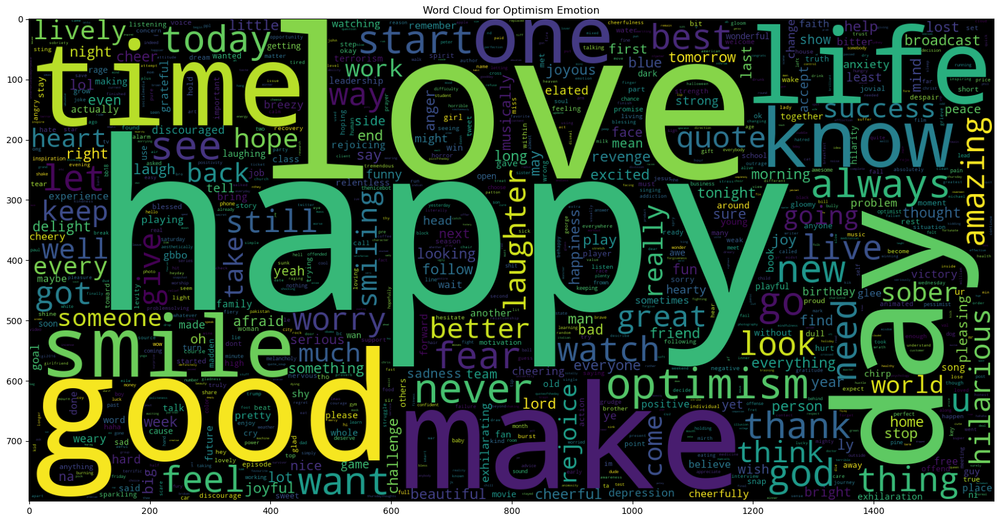

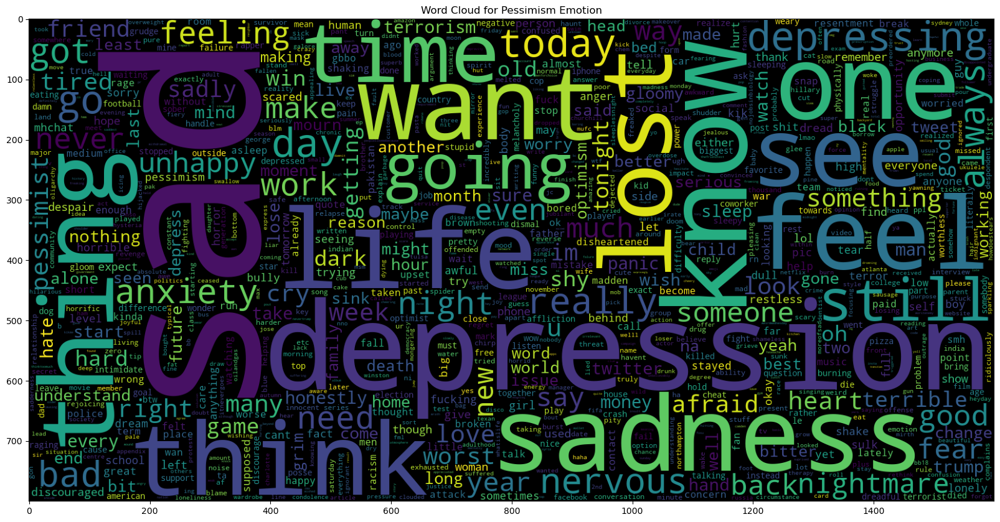

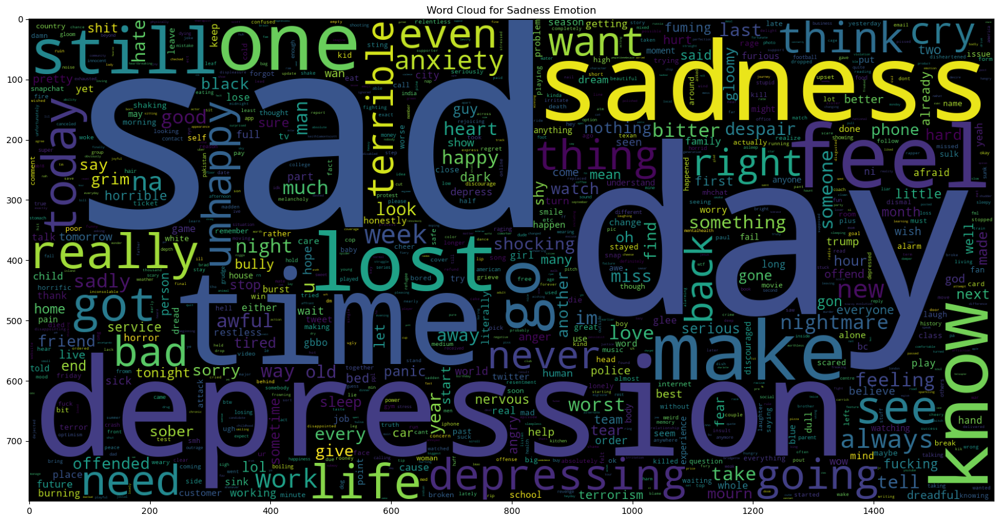

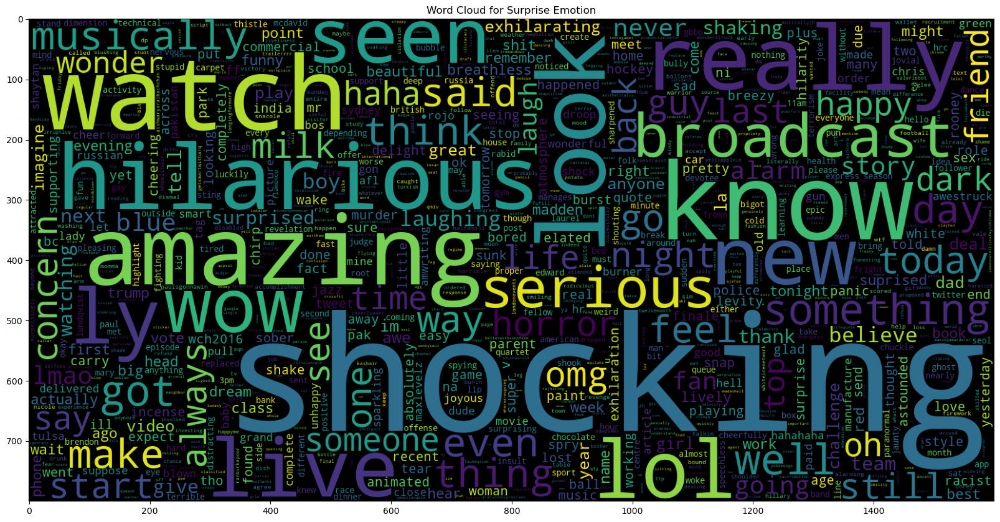

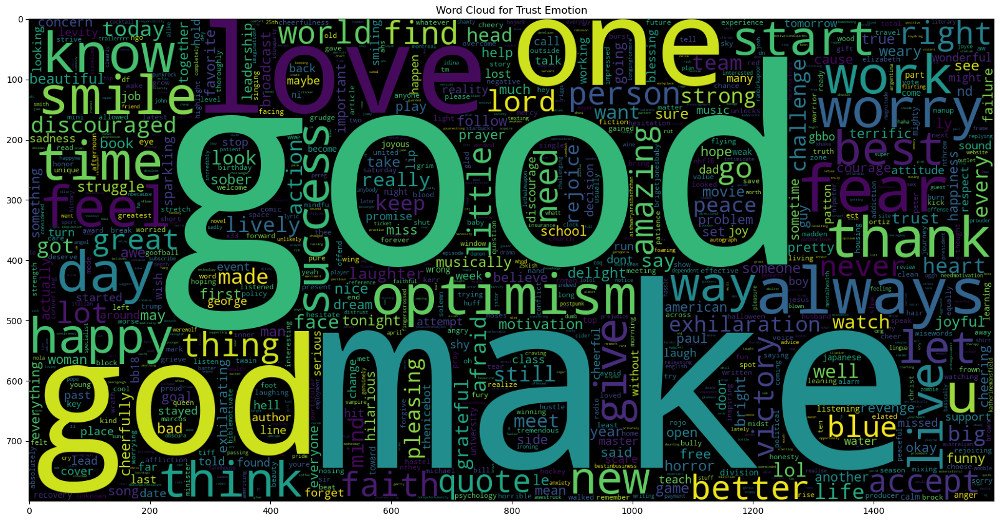

In [52]:
emotions = ['anger', 'anticipation', 'disgust', 'fear', 'joy', 'love', 'optimism', 'pessimism', 'sadness', 'surprise', 'trust'];

for emotion in emotions:
    emotion_tweets = train_data[train_data[emotion] == 1]
    wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
              collocations=False).generate(" ".join(emotion_tweets['Tweet']))
    plt.figure(figsize = (20,20))
    plt.title(f"Word Cloud for {emotion.capitalize()} Emotion")
    plt.imshow(wc)

# BoW Model:

In [53]:
countvec = CountVectorizer() 
bow_x_train = countvec.fit_transform(train_data['Tweet'])

bow_x_dev = countvec.transform(dev_data['Tweet'])
bow_x_test = countvec.transform(test_data['Tweet'])


# Word2Vec Model

In [54]:
tokenized_tweet = train_data['Tweet'].apply(lambda x: x.split())
tokenized_dev_tweet = dev_data['Tweet'].apply(lambda x: x.split())
tokenized_test_tweet = test_data['Tweet'].apply(lambda x: x.split())

In [55]:
import numpy as np
model = Word2Vec(tokenized_tweet, vector_size=300, min_count=2, sg = 1,seed = 0) 

Let us test most similar word to Love.

In [56]:
model.wv.most_similar('love')

[('need', 0.9988733530044556),
 ('god', 0.9988393187522888),
 ('think', 0.9988116025924683),
 ('best', 0.9988099932670593),
 ('old', 0.9988036155700684),
 ('friend', 0.9986867308616638),
 ('find', 0.9986680150032043),
 ('always', 0.9986326694488525),
 ('today', 0.9986283779144287),
 ('know', 0.9986256957054138)]

List of words which have been used more than 5 times.

In [57]:
most_words = list(model.wv.key_to_index.keys())
print("number of words that occurred minimum 5 times:", len(most_words))
print("sample words:", most_words[0:50])

number of words that occurred minimum 5 times: 5989
sample words: ['like', 'get', 'day', 'one', 'time', 'make', 'know', 'love', 'happy', 'good', 'go', 'want', 'got', 'life', 'think', 'see', 'would', 'feel', 'need', 'today', 'still', 'really', 'going', 'never', 'back', 'thing', 'look', 'always', 'sad', 'even', 'new', 'watch', 'someone', 'way', 'much', 'say', 'fear', 'let', 'smile', 'start', 'right', 'lost', 'na', 'u', 'lol', 'work', 'live', 'ever', 'man', 'come']


In [58]:
model.train(tokenized_tweet, total_examples= len(train_data['Tweet']), epochs=20)


def word_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0
    for word in tokens:
        try:
            vec += model.wv[word].reshape((1, size))
            count += 1.
        except KeyError:
            continue
    if count != 0:
        vec /= count
    return vec

wordvec_arrays = np.zeros((len(tokenized_tweet), 300)) 
for i in range(len(tokenized_tweet)):
    wordvec_arrays[i,:] = word_vector(tokenized_tweet[i], 300)
wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape

wordvec_dev_arrays = np.zeros((len(tokenized_dev_tweet), 300)) 
for i in range(len(tokenized_dev_tweet)):
    wordvec_dev_arrays[i,:] = word_vector(tokenized_dev_tweet[i], 300)
wordvec_dev_df = pd.DataFrame(wordvec_dev_arrays)

wordvec_test_arrays = np.zeros((len(tokenized_test_tweet), 300)) 
for i in range(len(tokenized_test_tweet)):
    wordvec_test_arrays[i,:] = word_vector(tokenized_test_tweet[i], 300)
wordvec_test_df = pd.DataFrame(wordvec_test_arrays)

#### b. Compare the performance of the two models. Discuss which method worked better for this task. Present any theories or observations regarding these results. Consider addressing class imbalance, if any.

# For BoW Method:

In [59]:
for emotion in emotions:

    y_train = train_data[emotion]
        
    decisionTreeModel = DecisionTreeClassifier(criterion= 'entropy',
                                           max_depth = None, 
                                           splitter='best', 
                                           random_state=55)

    decisionTreeModel.fit(bow_x_train,y_train)
    y_dev_pred = decisionTreeModel.predict(bow_x_dev)
    
    accuracy_bow = accuracy_score(dev_data[emotion], y_dev_pred)
    print(f'Accuracy in BoW Model for {emotion}', accuracy_bow)

Accuracy in BoW Model for anger 0.54627539503386
Accuracy in BoW Model for anticipation 0.7686230248306998
Accuracy in BoW Model for disgust 0.5530474040632054
Accuracy in BoW Model for fear 0.7370203160270881
Accuracy in BoW Model for joy 0.4966139954853273
Accuracy in BoW Model for love 0.7866817155756207
Accuracy in BoW Model for optimism 0.5767494356659142
Accuracy in BoW Model for pessimism 0.8058690744920993
Accuracy in BoW Model for sadness 0.5948081264108352
Accuracy in BoW Model for surprise 0.9187358916478555
Accuracy in BoW Model for trust 0.9006772009029346


In [60]:
predictions = {}
for emotion in emotions:

    y_train = train_data[emotion]
        
    decisionTreeModel = DecisionTreeClassifier(criterion= 'entropy',
                                           max_depth = None, 
                                           splitter='best', 
                                           random_state=55)

    decisionTreeModel.fit(bow_x_train,y_train)
    y_test_pred = decisionTreeModel.predict(bow_x_test)
    predictions[emotion] = y_test_pred

predictionstest= pd.DataFrame(predictions)

predictionstest.to_csv('bowoutput.csv', index=False)

# For Word2Vec Method

In [61]:
from sklearn.neighbors import KNeighborsClassifier

for emotion in emotions:
    y_train = train_data[emotion]
        
    knnModel = KNeighborsClassifier(n_neighbors=5)
    knnModel.fit(wordvec_df, y_train)
    
    y_dev_pred = knnModel.predict(wordvec_dev_df)
    
    accuracy_word2vec = accuracy_score(dev_data[emotion], y_dev_pred)
    print(f'Accuracy in Word2Vec Model with KNN for {emotion}: {accuracy_word2vec}')

C:\Users\Tasne\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Tasne\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

Accuracy in Word2Vec Model with KNN for anger: 0.5654627539503386
Accuracy in Word2Vec Model with KNN for anticipation: 0.8318284424379232


C:\Users\Tasne\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Tasne\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

Accuracy in Word2Vec Model with KNN for disgust: 0.5474040632054176
Accuracy in Word2Vec Model with KNN for fear: 0.7968397291196389


C:\Users\Tasne\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Tasne\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

Accuracy in Word2Vec Model with KNN for joy: 0.5146726862302483
Accuracy in Word2Vec Model with KNN for love: 0.8069977426636569


C:\Users\Tasne\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


Accuracy in Word2Vec Model with KNN for optimism: 0.6106094808126411


C:\Users\Tasne\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


Accuracy in Word2Vec Model with KNN for pessimism: 0.863431151241535


C:\Users\Tasne\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


Accuracy in Word2Vec Model with KNN for sadness: 0.626410835214447


C:\Users\Tasne\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Tasne\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

Accuracy in Word2Vec Model with KNN for surprise: 0.9582392776523702
Accuracy in Word2Vec Model with KNN for trust: 0.9413092550790068


In [62]:
from sklearn.neighbors import KNeighborsClassifier

predictions = {}
for emotion in emotions:
    y_train = train_data[emotion]
        
    knnModel = KNeighborsClassifier(n_neighbors=5)
    knnModel.fit(wordvec_df, y_train)
    
    y_test_pred = knnModel.predict(wordvec_test_df)
    predictions[emotion] = y_test_pred

    
predictionstest= pd.DataFrame(predictions)

predictionstest.to_csv('word2vecoutput.csv', index=False)

C:\Users\Tasne\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Tasne\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

It is evident that Word2Vec yields superior results compared to Bag of Words for every emotion.

Bag of Words is a collection of words regardless of their types, whereas Word2Vec represents words in a neural network within a high-dimensional space. In contrast to Bag of Words, Word2Vec also captures the relationships between words, which increases the likelihood of obtaining better outcomes.

When evaluating emotions, a single word can influence the sentiment of a sentence, but the interplay between words can alter the meaning and consequently the emotions conveyed. Hence, it was anticipated that Word2Vec would yield superior results.

One observation is that although the output results are not yet satisfactory, applying a deep learning model on top of Word2Vec can enhance prediction outcomes to surpass the 90% threshold.

### Q5: Topic Modeling [1]

#### a. On the SemEval-2018 Task 1 dataset, perform topic modeling using Latent Dirichlet Allocation (LDA).

In [63]:
from sklearn.decomposition import LatentDirichletAllocation

lda = LatentDirichletAllocation(n_components=5, random_state=42)
lda.fit(bow_x_train)


LatentDirichletAllocation(n_components=5, random_state=42)

#### b. Visualize the top words for each topic. Write a brief description of what you think each topic represents based on these words.

In [65]:
countvec = CountVectorizer() 
bow_x_train = countvec.fit_transform(train_data['Tweet'])
feature_names = countvec.get_feature_names_out()

topic_keywords = []
for topic_weights in lda.components_:
    top_keywords_indices = topic_weights.argsort()[:-11:-1] 
    topic_keywords.append([feature_names[i] for i in top_keywords_indices])

for topic_idx, keywords in enumerate(topic_keywords):
    top_words = [keywords[i] for i in range(len(keywords))[:-10 - 1:-1]]
    print(f"Topic #{topic_idx+1}:")
    print(top_words)
    print()

Topic #1:
['even', 'much', 'love', 'na', 'say', 'terror', 'like', 'feel', 'happy', 'know']

Topic #2:
['thing', 'good', 'one', 'day', 'think', 'time', 'back', 'want', 'life', 'get']

Topic #3:
['one', 'anger', 'get', 'lost', 'today', 'going', 'got', 'time', 'good', 'day']

Topic #4:
['start', 'something', 'time', 'would', 'never', 'still', 'get', 'really', 'make', 'like']

Topic #5:
['get', 'love', 'musically', 'ly', 'lively', 'broadcast', 'one', 'amazing', 'live', 'watch']



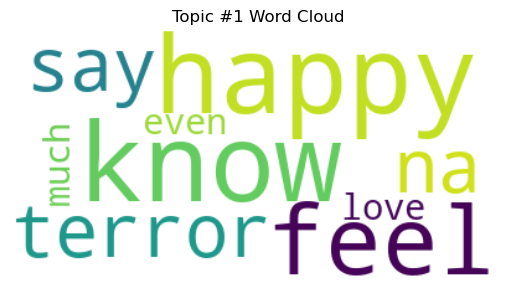

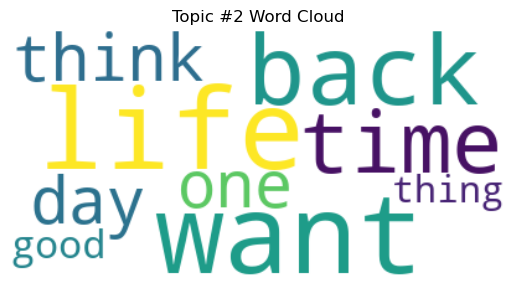

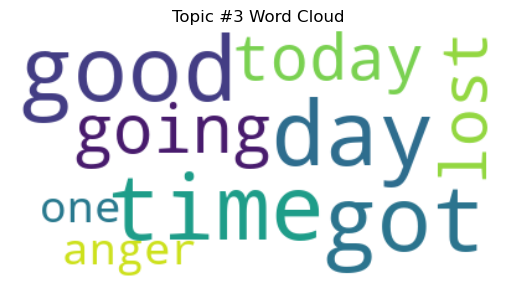

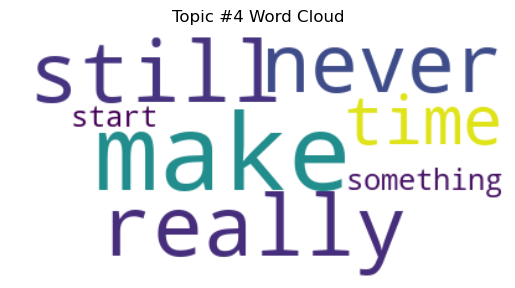

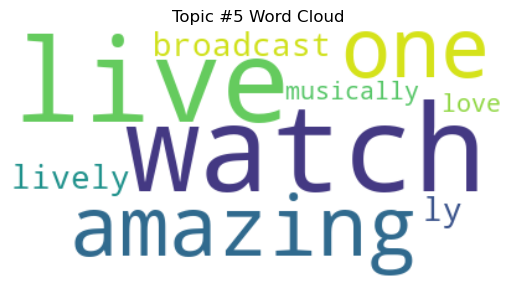

In [66]:
for topic_idx, keywords in enumerate(topic_keywords):
    # Join the keywords into a single string
    keyword_string = ' '.join(keywords)

    wordcloud = WordCloud(background_color='white').generate(keyword_string)

    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Topic #{topic_idx+1} Word Cloud')
    plt.show()

LDA (Latent Dirichlet Allocation) allocates words into distinct sets, each representing a particular theme or meaning. In our case, we have created five topics, and I believe each topic can be interpreted as follows:

1) The first topic focuses on expressing different moods, whether they are happy, filled with terror, or other emotional states.

2) The second topic encompasses words related to life and its various aspects.

3) The third topic revolves around words associated with the concept of a day, including events, routines, or occurrences.

4) The fourth topic encompasses words related to time, such as hours, minutes, or specific temporal references.

5) The fifth topic pertains to broadcasting and its related elements, including words like "watch" and their definitions, such as live streaming, captivating shows, or extraordinary experiences.


#### c. Discuss how well you think the model worked and any interesting findings.

According to my evaluation, the model performed well in identifying words related to feelings, shows, moods, and different aspects of life. It can accurately understand the emotions expressed in tweets and categorize them effectively. Additionally, the model can recognize words that indicate specific shows, giving us insights into what people are talking about.

An interesting finding is that the model can do more than just understand emotions. It can also predict the topics of tweets and identify the popular cultural trends. This means it can tell us whether people are discussing enjoying a sports match or sharing their current thoughts and experiences.

This shows that the model is versatile and can provide insights not only into emotions but also into the topics and trends people are talking about on social media.

## References:

[1] https://www.kaggle.com/code/nitin194/twitter-sentiment-analysis-word2vec-doc2vec/notebook <br>
[2] https://www.kaggle.com/code/lakshmi25npathi/sentiment-analysis-of-imdb-movie-reviews <br>
[3] https://www.kaggle.com/code/soumighosh99/imdb-dataset-bagofwords-tfidf-and-word2vec-model <br>